In [ ]:
!git clone https://github.com/soCzech/TransNet

In [ ]:
!pip3 install --upgrade --force-reinstall tensorflow-gpu==1.15.0 

In [ ]:
!pip install protobuf==3.20.*

In [3]:
# !pip install tensorflow
# pip install pillow
!pip install ffmpeg-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [1]:
%cd TransNet

/content/TransNet


In [4]:
!gdown --id 1bcAds2qz0rLDvwSCXFmaNozHWVu1DKj6

/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1bcAds2qz0rLDvwSCXFmaNozHWVu1DKj6
To: /content/TransNet/viet-nam-rut-ngan-thoi-gian-xet-nghiem-virus-corona-moi-vtv24.mp4
100% 15.7M/15.7M [00:00<00:00, 125MB/s] 


In [2]:
import ffmpeg
import numpy as np
import tensorflow as tf

from transnet import TransNetParams, TransNet
from transnet_utils import draw_video_with_predictions, scenes_from_predictions

In [3]:
# initialize the network
params = TransNetParams()
params.CHECKPOINT_PATH = "./model/transnet_model-F16_L3_S2_D256"

net = TransNet(params)




Instructions for updating:
If using Keras pass *_constraint arguments to layers.


[TransNet] Creating ops.
           Input (?, ?, 27, 48, 3)
           SDDCNN_1
           > DDCNN_1 (?, ?, 27, 48, 64)
           > DDCNN_2 (?, ?, 27, 48, 64)
           MaxPool (?, ?, 13, 24, 64)
           SDDCNN_2
           > DDCNN_1 (?, ?, 13, 24, 128)
           > DDCNN_2 (?, ?, 13, 24, 128)
           MaxPool (?, ?, 6, 12, 128)
           SDDCNN_3
           > DDCNN_1 (?, ?, 6, 12, 256)


           > DDCNN_2 (?, ?, 6, 12, 256)
           MaxPool (?, ?, 3, 6, 256)
           Flatten (?, ?, 4608)
           Dense (?, ?, 256)
           Logits (?, ?, 2)
           Predictions (?, ?)
[TransNet] Network built.
[TransNet] Found 4614850 trainable parameters.
[TransNet] Parameters restored from 'transnet_model-F16_L3_S2_D256'.


In [5]:
# export video into numpy array using ffmpeg
video_stream, err = (
    ffmpeg
    .input('viet-nam-rut-ngan-thoi-gian-xet-nghiem-virus-corona-moi-vtv24.mp4')
    .output('pipe:', format='rawvideo', pix_fmt='rgb24', s='{}x{}'.format(params.INPUT_WIDTH, params.INPUT_HEIGHT))
    .run(capture_stdout=True)
)
video = np.frombuffer(video_stream, np.uint8).reshape([-1, params.INPUT_HEIGHT, params.INPUT_WIDTH, 3])

In [6]:
# predict transitions using the neural network
predictions = net.predict_video(video)

[TransNet] Processing video frames 9051/9051


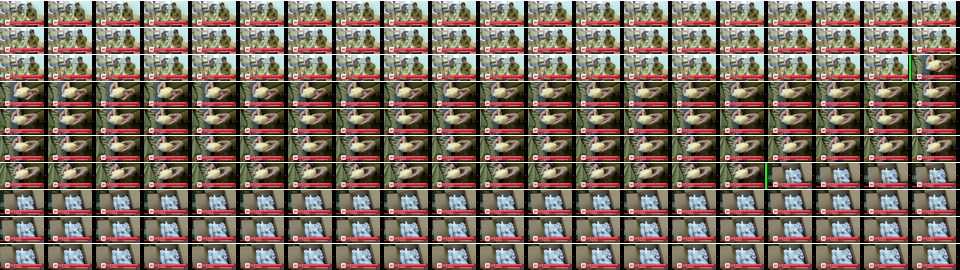

In [7]:
# For ilustration purposes, we show only 200 frames starting with frame number 8000.
draw_video_with_predictions(video[8000:8200], predictions[8000:8200], threshold=0.1)

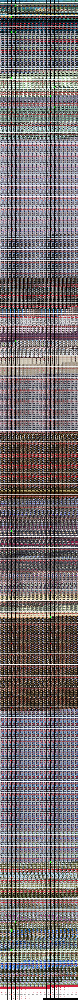

In [11]:
draw_video_with_predictions(video[:], predictions[:], threshold=0.1)

In [10]:
# Generate list of scenes from predictions, returns tuples of (start frame, end frame)
scenes = scenes_from_predictions(predictions, threshold=0.1)

# For ilustration purposes, only the visualized scenes are shown.
scenes[:]

array([[   0,   43],
       [  44,   88],
       [  89,  121],
       [ 122,  142],
       [ 143,  282],
       [ 284,  648],
       [ 650,  702],
       [ 703,  793],
       [ 794,  872],
       [ 873,  973],
       [ 974, 1107],
       [1108, 1185],
       [1186, 1257],
       [1258, 2132],
       [2133, 2519],
       [2521, 2609],
       [2610, 2710],
       [2711, 2797],
       [2798, 2874],
       [2875, 2951],
       [2952, 3018],
       [3019, 3083],
       [3084, 3157],
       [3158, 3230],
       [3231, 3295],
       [3296, 3389],
       [3390, 3914],
       [3916, 3975],
       [3976, 4421],
       [4422, 4514],
       [4515, 4520],
       [4521, 4802],
       [4803, 4917],
       [4918, 5079],
       [5080, 5187],
       [5188, 5284],
       [5285, 5387],
       [5388, 5441],
       [5442, 5490],
       [5491, 5544],
       [5545, 5592],
       [5593, 6434],
       [6436, 7811],
       [7813, 7889],
       [7890, 7968],
       [7969, 8058],
       [8059, 8135],
       [8136,